In [5]:
! pip install ultralytics --upgrade --quiet

In [ ]:
import os
import cv2
import numpy as np
import pickle
from PIL import Image
from ultralytics import YOLO
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet import preprocess_input

# YOLO model
trained_model_path = '../yolo/best.pt'  # Update with your model path
yolo_model = YOLO(trained_model_path)

# Function to generate bounding boxes
def generate_bbox(img_path, conf_thres=0.3):
    results = yolo_model(img_path, conf=conf_thres)
    output = []
    for result in results[0].boxes:
        cls = result.cls.item()
        score = result.conf.item()
        bbox = result.xyxy[0].cpu().numpy().astype(int)
        class_name = yolo_model.names[int(cls)]
        output.append((class_name, score, bbox))
    return output

# Function to extract clothes
def extract_clothes(img_path: str):
    try:
        image = Image.open(img_path).convert('RGB')
        image_np = np.array(image)
    except Exception as e:
        print(f"Error opening image: {e}")
        return {}

    results = generate_bbox(img_path, conf_thres=0.3)
    outputs = {"original_image": image_np}
    for result in results:
        class_name, score, bbox = result
        XMIN, YMIN, XMAX, YMAX = bbox
        print(f"Detected {class_name} with confidence {score:.2f} at [{XMIN}, {YMIN}, {XMAX}, {YMAX}]")
        
        XMIN = max(0, XMIN)
        YMIN = max(0, YMIN)
        XMAX = min(image_np.shape[1], XMAX)
        YMAX = min(image_np.shape[0], YMAX)
        
        extracted_image = image_np[YMIN:YMAX, XMIN:XMAX]
        outputs[class_name.lower()] = extracted_image
    
    return outputs

# Embedding Model (Using ResNet50)
resnet_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')

def calculate_embeddings(image_array):
    try:
        img = cv2.resize(image_array, (224, 224))
        img = np.expand_dims(img, axis=0)
        img = preprocess_input(img)

        embeddings = resnet_model.predict(img)
        return embeddings
    except Exception as e:
        print(f"Error during embedding calculation: {e}")
        return None

# Process the entire dataset
dataset_dir = '../terminalx/images/'  # Update with the path to your images folder
output_embeddings = {}  # Dictionary to store embeddings for each image

for img_name in os.listdir(dataset_dir):
    img_path = os.path.join(dataset_dir, img_name)
    if img_path.endswith(('.jpg', '.jpeg', '.png')):  # Check for valid image file
        print(f"Processing image: {img_name}")
        extracted_parts = extract_clothes(img_path)
        
        for part, part_image in extracted_parts.items():
            if part != "original_image":
                print(f"Processing part: {part}")
                embeddings = calculate_embeddings(part_image)
                if embeddings is not None:
                    # Use the real image name and part type to store embeddings
                    key = f"{img_name}_{part}"
                    output_embeddings[key] = embeddings
                    print(f"Embeddings for {key} calculated successfully.\n")

# Save the embeddings
output_embeddings_path = '../embeddings/terminalx_embeddings.pkl'  # Path to save the embeddings
with open(output_embeddings_path, 'wb') as f:
    pickle.dump(output_embeddings, f)

print(f"All embeddings saved to {output_embeddings_path}")


Processing image: 668dad59e415d9bc6a43f9f8.jpg

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../terminalx/images/668dad59e415d9bc6a43f9f8.jpg: 640x480 1 Topwear, 1 Bottomwear, 2 Footwears, 95.7ms
Speed: 3.0ms preprocess, 95.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)
Detected Bottomwear with confidence 0.90 at [128, 192, 234, 281]
Detected Footwear with confidence 0.87 at [158, 415, 193, 470]
Detected Footwear with confidence 0.85 at [229, 419, 294, 469]
Detected Topwear with confidence 0.78 at [120, 82, 219, 208]
Processing part: bottomwear
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 671ms/step
Embeddings for 668dad59e415d9bc6a43f9f8.jpg_bottomwear calculated successfully.

Processing part: footwear
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Embeddings for 668dad59e415d9bc6a43f9f8.jpg_footwear calculated successfully.

Processing part: topwear
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Embeddings for 668dad59e415d9bc6a43f9f8.jpg_topwear calculated successf

In [10]:
# Gender Classification Model

import torch
import torch.nn as nn
from PIL import Image
from torchvision import models,transforms

In [12]:
# Define the gender model

class GenderClassificationModel(nn.Module):
    def __init__(self):
        super(GenderClassificationModel, self).__init__()
        self.model = models.resnet50(pretrained=True)
        for param in self.model.parameters():
            param.requires_grad = False  # Freeze the layers
        num_features = self.model.fc.in_features
        self.model.fc = nn.Linear(num_features, 2)
    
    def forward(self, x):
        return self.model(x)

gender_model = GenderClassificationModel()

/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [14]:
# Load the state dictionary
state_dict = torch.load('../gender_classification_model/gender_classification_model.pth')
gender_model.load_state_dict(state_dict)
gender_model.eval()  # Set the model to evaluation mode

# Define data transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Function to load and preprocess image
def load_and_preprocess_image(img_path):
    img = Image.open(img_path).convert('RGB')
    img = transform(img)
    img = img.unsqueeze(0)  # Add batch dimension
    return img

# Function to predict gender
def predict_gender(img_path):
    img = load_and_preprocess_image(img_path)
    with torch.no_grad():
        output = gender_model(img)
        # Assuming the model output is a probability for male
        # Change this logic based on your model's output
        _, predicted = torch.max(output, 1)
        if predicted.item() == 0:  # 1 = 'Male' 0 = 'Female'
            return 'men'
        else:
            return 'women'

In [34]:
# Recommendation System 
import os
import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
import pickle
import matplotlib.pyplot as plt


In [120]:

# Load the saved embeddings for each clothing part
with open('../embeddings/terminalx_embeddings.pkl', 'rb') as f:
    embeddings_dict = pickle.load(f)
print(f"Loaded embeddings with {len(embeddings_dict)} entries.")

# Load the DataFrame containing the image metadata (e.g., image names, categories)
df = pd.read_csv('../embeddings/dataset_with_embeddings-new.csv')
print("Loaded DataFrame:")
print(df.head())

# Create a dictionary to map image names to genders
df['_id'] = df['_id'].str.split('.').str[0]  # Remove file extension if needed
image_gender_map = df.set_index('_id')['gender'].to_dict()

Loaded embeddings with 50233 entries.
Loaded DataFrame:
                        _id                    code  \
0  668dad59e415d9bc6a43c684   TERMINALX-z3819400069   
1  668dad59e415d9bc6a43c685  TERMINALX-x59233000510   
2  668dad59e415d9bc6a43c686  TERMINALX-z84857001720   
3  668dad59e415d9bc6a43c687   TERMINALX-w3387500014   
4  668dad59e415d9bc6a43c688   TERMINALX-z9270000069   

                                                 img  \
0  https://media.terminalx.com/pub/media/catalog/...   
1  https://media.terminalx.com/pub/media/catalog/...   
2  https://media.terminalx.com/pub/media/catalog/...   
3  https://media.terminalx.com/pub/media/catalog/...   
4  https://media.terminalx.com/pub/media/catalog/...   

                                 title     price  \
0  גופיית ווש עם שוליים גזורים / גברים   49.95 ₪   
1                       גופייה עם לוגו   83.93 ₪   
2          גופייה עם הדפס לוגו / גברים   83.93 ₪   
3                     חולצת פולו סרוגה  230.93 ₪   
4               

In [88]:

# Function to display images including the test image
def display_images(test_image, recommendations):
    plt.figure(figsize=(20, 10))
    
    # Display the test image
    plt.subplot(1, len(recommendations) + 1, 1)
    img = Image.open(test_image)
    plt.imshow(img)
    plt.title('Test Image')
    plt.axis('off')
    
    # Display the recommended images
    for i, (img_name, sim_score) in enumerate(recommendations):
        original_img_name = img_name.split('_')[0]  # Extract the original image name
        img_path = os.path.join('../terminalx/images', original_img_name)
        img = Image.open(img_path)
        plt.subplot(1, len(recommendations) + 1, i + 2)
        plt.imshow(img)
        plt.title(f'Similarity: {sim_score:.4f}')
        plt.axis('off')
    plt.show()

In [136]:
# Function to recommend similar items based on a specific part embedding and gender
def recommend_items(part_name, query_embedding, gender, top_n=5):
    similarities = []
    for key, embedding in embeddings_dict.items():
        if part_name in key:
            img_name = key.split('.')[0]  # Extract the image name
            if img_name in image_gender_map and image_gender_map[img_name] == gender:
                sim = cosine_similarity(query_embedding, embedding.reshape(1, -1))
                similarities.append((key, sim[0][0]))

    # Sort by similarity score in descending order
    similarities = sorted(similarities, key=lambda x: x[1], reverse=True)
    
    # Get top N recommendations
    top_recommendations = similarities[:top_n]

    # Display the recommended images along with the test image
    display_images(test_image_path, top_recommendations)

    return top_recommendations


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../yolo/ecommerce_dataset/val/images/dataset_faldas_1055.png: 640x512 1 Topwear, 1 Bottomwear, 2 Footwears, 99.8ms
Speed: 2.9ms preprocess, 99.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 512)
Detected Bottomwear with confidence 0.89 at [125, 381, 354, 703]
Detected Topwear with confidence 0.86 at [118, 146, 365, 422]
Detected Footwear with confidence 0.84 at [184, 1026, 319, 1109]
Detected Footwear with confidence 0.83 at [86, 923, 164, 1087]
Predicted gender: women
Processing topwear...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
Query embedding for topwear: [[  0.0023034      2.1896           0 ...     0.04087    0.073606     0.76494]]...


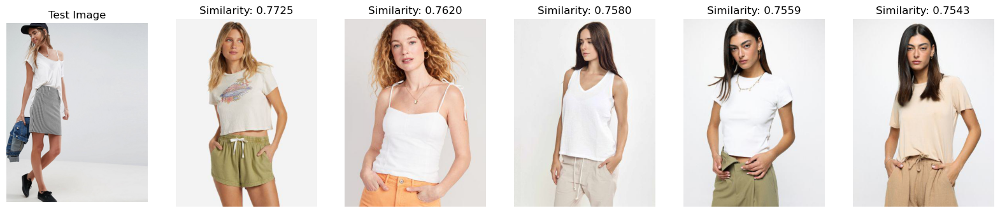

Processing bottomwear...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Query embedding for bottomwear: [[    0.32992      1.6116  0.00054126 ...           0     0.18246      2.7375]]...


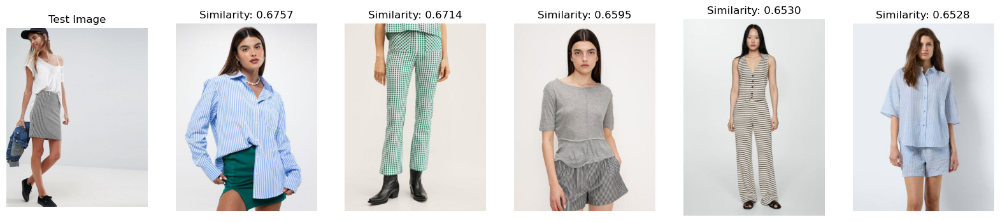

Processing footwear...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
Query embedding for footwear: [[   0.013977      1.0463      0.4112 ...     0.37246    0.093784      0.4203]]...


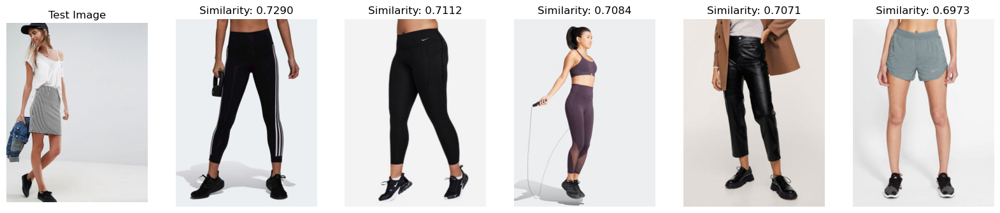

In [146]:
# 1 Test image 
# Path to the test image
test_image_path = '../yolo/ecommerce_dataset/val/images/dataset_faldas_1055.png'  # Update with your sample image path

# Extract parts and calculate embeddings
extracted_parts = extract_clothes(test_image_path)

# Predict the gender of the test image
gender = predict_gender(test_image_path)
print(f"Predicted gender: {gender}")

# Example: Recommend similar items for each part (topwear, bottomwear, footwear)
for part in ['topwear', 'bottomwear', 'footwear']:
    if part in extracted_parts:
        print(f"Processing {part}...")
        query_embedding = calculate_embeddings(extracted_parts[part])
        
        if query_embedding is not None:
            print(f"Query embedding for {part}: {query_embedding[:5]}...")  # Print first 5 elements of the embedding
            recommend_items(part, query_embedding, gender, top_n=5)


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../yolo/ecommerce_dataset/train/images/dataset_abrigos_120.png: 640x512 1 Topwear, 1 Bottomwear, 83.3ms
Speed: 3.2ms preprocess, 83.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 512)
Detected Bottomwear with confidence 0.89 at [15, 736, 360, 1110]
Detected Topwear with confidence 0.88 at [0, 177, 535, 1086]
Predicted gender for ../yolo/ecommerce_dataset/train/images/dataset_abrigos_120.png: men
Processing topwear for ../yolo/ecommerce_dataset/train/images/dataset_abrigos_120.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
Query embedding for topwear: [[     1.5649      0.5681           0 ...     0.39148     0.17978       1.021]]...


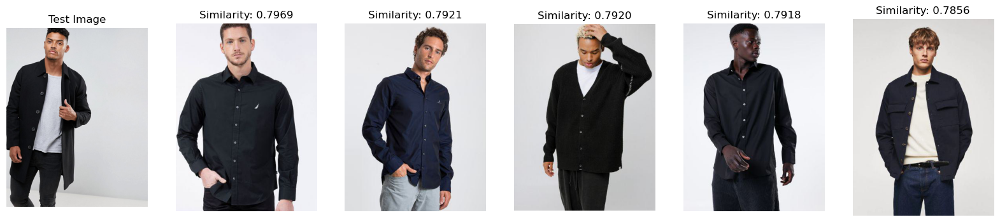

Processing bottomwear for ../yolo/ecommerce_dataset/train/images/dataset_abrigos_120.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Query embedding for bottomwear: [[    0.43546     0.28472           0 ...     0.29671     0.10537        1.16]]...


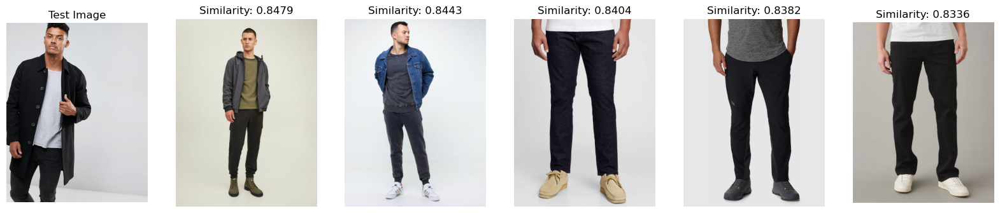


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../yolo/ecommerce_dataset/train/images/dataset_abrigos_260.png: 640x512 1 Topwear, 1 Bottomwear, 76.3ms
Speed: 2.4ms preprocess, 76.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 512)
Detected Topwear with confidence 0.92 at [44, 196, 676, 1047]
Detected Bottomwear with confidence 0.87 at [188, 887, 563, 1110]
Predicted gender for ../yolo/ecommerce_dataset/train/images/dataset_abrigos_260.png: men
Processing topwear for ../yolo/ecommerce_dataset/train/images/dataset_abrigos_260.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
Query embedding for topwear: [[    0.46361      2.5282     0.42325 ...     0.23595    0.075697      2.1754]]...


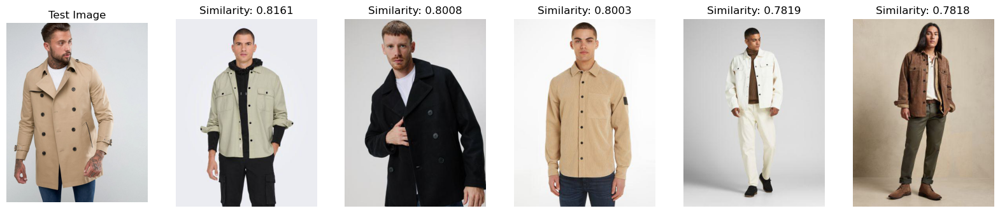

Processing bottomwear for ../yolo/ecommerce_dataset/train/images/dataset_abrigos_260.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Query embedding for bottomwear: [[    0.97211     0.58235     0.15926 ...      1.2456      2.2404      7.1403]]...


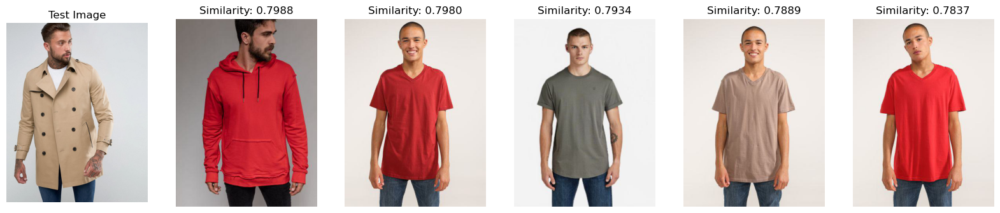


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../yolo/ecommerce_dataset/train/images/dataset_camisas-y-blusas_88.png: 640x448 1 Topwear, 1 Bottomwear, 68.6ms
Speed: 2.7ms preprocess, 68.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 448)
Detected Bottomwear with confidence 0.87 at [370, 2008, 1403, 2529]
Detected Topwear with confidence 0.85 at [323, 550, 1485, 2253]
Predicted gender for ../yolo/ecommerce_dataset/train/images/dataset_camisas-y-blusas_88.png: women
Processing topwear for ../yolo/ecommerce_dataset/train/images/dataset_camisas-y-blusas_88.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
Query embedding for topwear: [[   0.066557     0.60447           0 ...     0.20801    0.066975     0.48128]]...


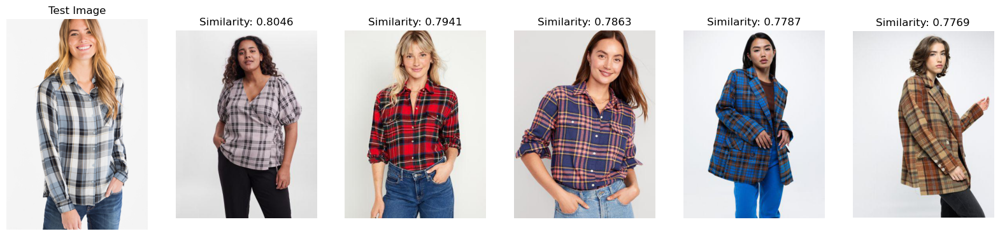

Processing bottomwear for ../yolo/ecommerce_dataset/train/images/dataset_camisas-y-blusas_88.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Query embedding for bottomwear: [[    0.37144      1.1426           0 ...    0.068175     0.11725      2.4836]]...


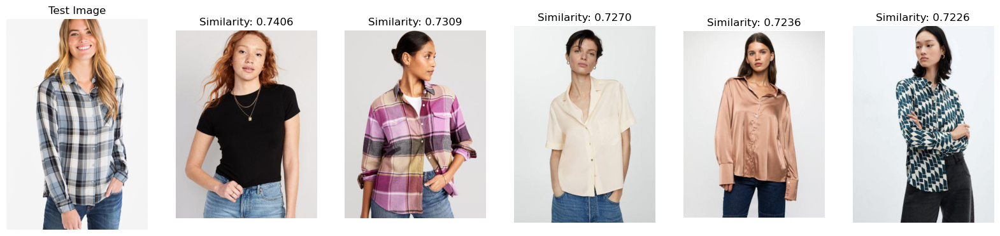


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../yolo/ecommerce_dataset/train/images/dataset_vestidos_2232.png: 640x448 1 Topwear, 2 Footwears, 61.1ms
Speed: 2.2ms preprocess, 61.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 448)
Detected Footwear with confidence 0.84 at [881, 2247, 1111, 2514]
Detected Topwear with confidence 0.79 at [648, 371, 1219, 1573]
Detected Footwear with confidence 0.78 at [450, 2218, 766, 2480]
Predicted gender for ../yolo/ecommerce_dataset/train/images/dataset_vestidos_2232.png: women
Processing topwear for ../yolo/ecommerce_dataset/train/images/dataset_vestidos_2232.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Query embedding for topwear: [[   0.025413     0.40206           0 ...     0.28314    0.064295     0.83977]]...


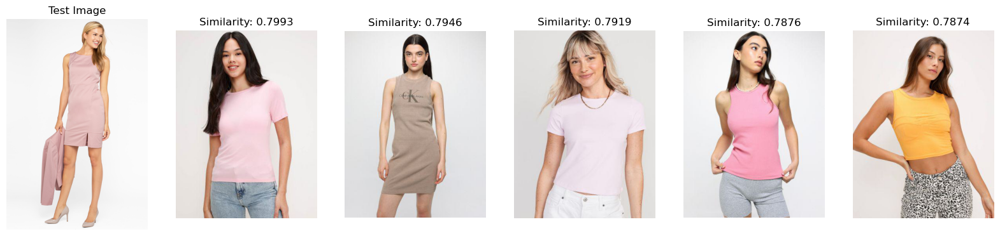

Processing footwear for ../yolo/ecommerce_dataset/train/images/dataset_vestidos_2232.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Query embedding for footwear: [[          0     0.25923    0.078053 ...     0.18351    0.052511     0.28408]]...


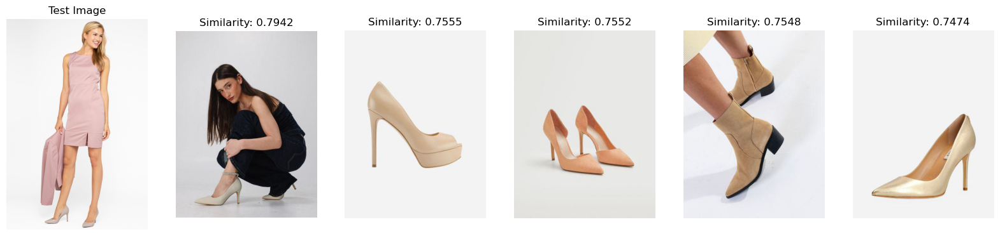

In [140]:
# List of test image paths
test_image_paths = [
    '../yolo/ecommerce_dataset/train/images/dataset_abrigos_120.png',
    '../yolo/ecommerce_dataset/train/images/dataset_abrigos_260.png',
    '../yolo/ecommerce_dataset/train/images/dataset_camisas-y-blusas_88.png',
    '../yolo/ecommerce_dataset/train/images/dataset_vestidos_2232.png',
    # Add more image paths as needed
]

# Loop through each test image path
for test_image_path in test_image_paths:
    # Extract parts and calculate embeddings
    extracted_parts = extract_clothes(test_image_path)

    # Predict the gender of the test image
    gender = predict_gender(test_image_path)
    print(f"Predicted gender for {test_image_path}: {gender}")

    # Example: Recommend similar items for each part (topwear, bottomwear, footwear)
    for part in ['topwear', 'bottomwear', 'footwear']:
        if part in extracted_parts:
            print(f"Processing {part} for {test_image_path}...")
            query_embedding = calculate_embeddings(extracted_parts[part])
            
            if query_embedding is not None:
                print(f"Query embedding for {part}: {query_embedding[:5]}...")  # Print first 5 elements of the embedding
                recommend_items(part, query_embedding, gender, top_n=5)


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../yolo/ecommerce_dataset/train/images/dataset_abrigos_1575.png: 640x448 1 Topwear, 1 Bottomwear, 69.8ms
Speed: 5.0ms preprocess, 69.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 448)
Detected Topwear with confidence 0.89 at [207, 575, 1433, 2119]
Detected Bottomwear with confidence 0.89 at [408, 1834, 1207, 2529]
Predicted gender for ../yolo/ecommerce_dataset/train/images/dataset_abrigos_1575.png: men
Processing topwear for ../yolo/ecommerce_dataset/train/images/dataset_abrigos_1575.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
Query embedding for topwear: [[     0.8483     0.45655           0 ...    0.037953           0     0.42169]]...


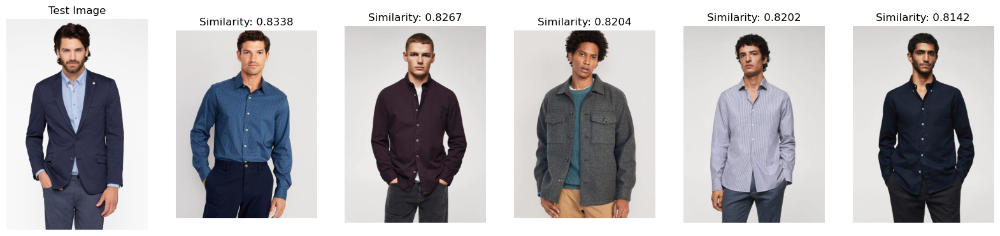

Processing bottomwear for ../yolo/ecommerce_dataset/train/images/dataset_abrigos_1575.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
Query embedding for bottomwear: [[    0.43961      2.2393           0 ...           0   0.0063859     0.62152]]...


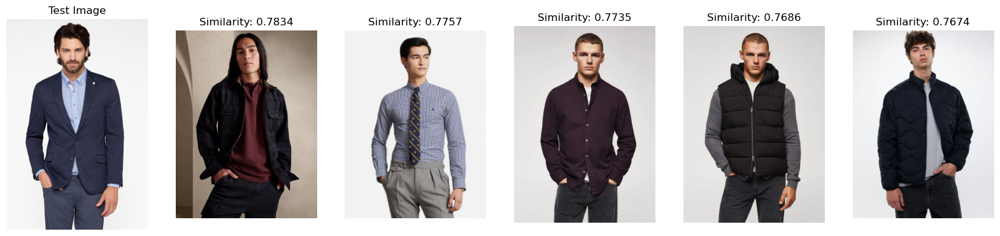


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../yolo/ecommerce_dataset/train/images/dataset_shorts_2414.png: 640x512 3 Topwears, 1 Bottomwear, 2 Footwears, 176.2ms
Speed: 2.3ms preprocess, 176.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 512)
Detected Bottomwear with confidence 0.86 at [192, 407, 432, 601]
Detected Footwear with confidence 0.83 at [133, 972, 261, 1085]
Detected Footwear with confidence 0.83 at [436, 967, 544, 1077]
Detected Topwear with confidence 0.66 at [86, 51, 404, 405]
Detected Topwear with confidence 0.66 at [201, 188, 401, 397]
Detected Topwear with confidence 0.48 at [115, 162, 406, 403]
Predicted gender for ../yolo/ecommerce_dataset/train/images/dataset_shorts_2414.png: women
Processing topwear for ../yolo/ecommerce_dataset/train/images/dataset_shorts_2414.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
Query embedding for topwear: [[          0      1.0362           0 ...    0.022052    0.045984     0.22124]]...


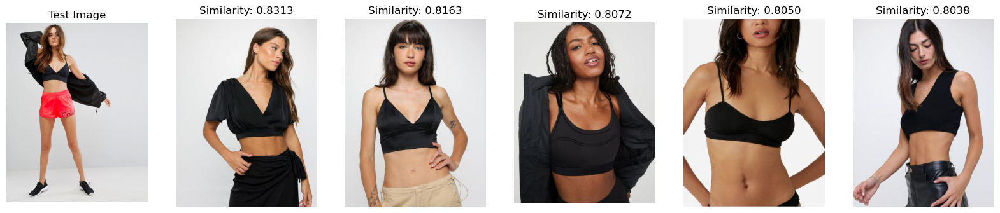

Processing bottomwear for ../yolo/ecommerce_dataset/train/images/dataset_shorts_2414.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
Query embedding for bottomwear: [[     1.0558     0.22643           0 ...     0.29124     0.91567      2.0147]]...


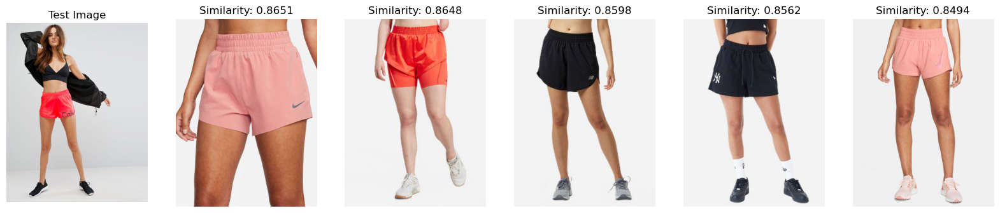

Processing footwear for ../yolo/ecommerce_dataset/train/images/dataset_shorts_2414.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Query embedding for footwear: [[   0.017935     0.54549     0.30037 ...    0.033885     0.03783     0.50242]]...


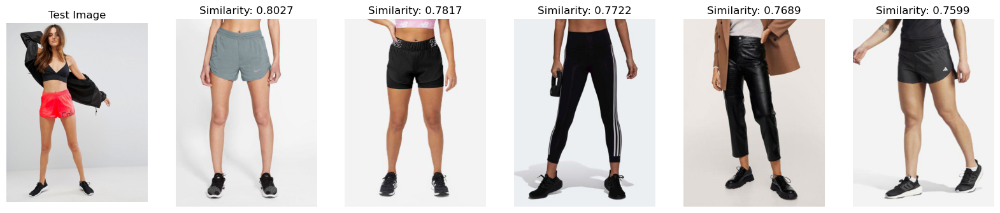


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../yolo/ecommerce_dataset/train/images/dataset_sandalias_245.png: 640x480 1 Footwear, 81.7ms
Speed: 3.2ms preprocess, 81.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
Detected Footwear with confidence 0.89 at [245, 810, 804, 1196]
Predicted gender for ../yolo/ecommerce_dataset/train/images/dataset_sandalias_245.png: women
Processing footwear for ../yolo/ecommerce_dataset/train/images/dataset_sandalias_245.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Query embedding for footwear: [[   0.035429      2.2852     0.33972 ...     0.47327   0.0055655     0.10424]]...


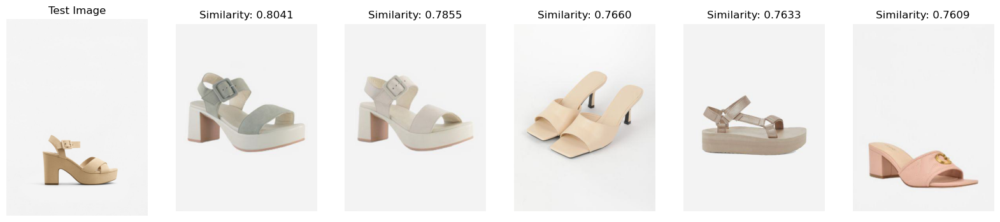


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../yolo/ecommerce_dataset/train/images/dataset_vestidos_2151.png: 640x448 1 Topwear, 2 Footwears, 66.5ms
Speed: 3.4ms preprocess, 66.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 448)
Detected Topwear with confidence 0.83 at [530, 382, 1248, 2318]
Detected Footwear with confidence 0.71 at [850, 2194, 1131, 2502]
Detected Footwear with confidence 0.66 at [620, 2229, 847, 2517]
Predicted gender for ../yolo/ecommerce_dataset/train/images/dataset_vestidos_2151.png: women
Processing topwear for ../yolo/ecommerce_dataset/train/images/dataset_vestidos_2151.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Query embedding for topwear: [[    0.19688     0.12527     0.79492 ...     0.11627     0.21467     0.28932]]...


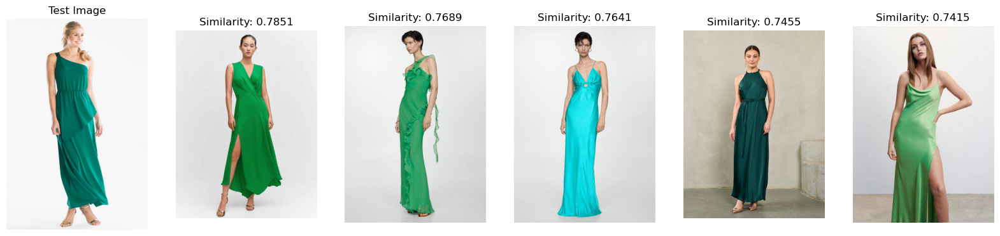

Processing footwear for ../yolo/ecommerce_dataset/train/images/dataset_vestidos_2151.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Query embedding for footwear: [[          0     0.27651           0 ...     0.26615     0.11499      1.0474]]...


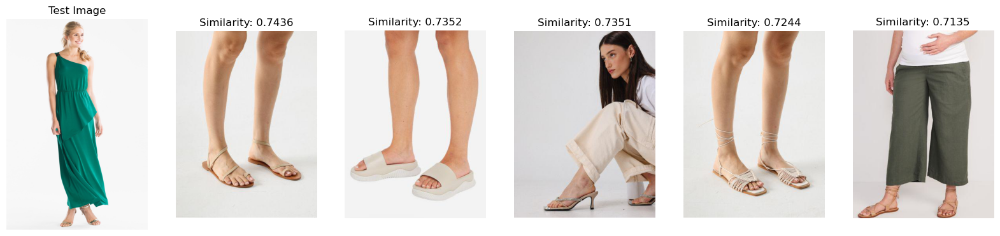


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../yolo/ecommerce_dataset/train/images/dataset_sudaderas_682.png: 640x512 1 Topwear, 1 Bottomwear, 75.3ms
Speed: 2.6ms preprocess, 75.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 512)
Detected Bottomwear with confidence 0.89 at [80, 786, 591, 1109]
Detected Topwear with confidence 0.88 at [155, 186, 729, 881]
Predicted gender for ../yolo/ecommerce_dataset/train/images/dataset_sudaderas_682.png: men
Processing topwear for ../yolo/ecommerce_dataset/train/images/dataset_sudaderas_682.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
Query embedding for topwear: [[   0.021832      1.6271           0 ...     0.27829     0.86425      1.4543]]...


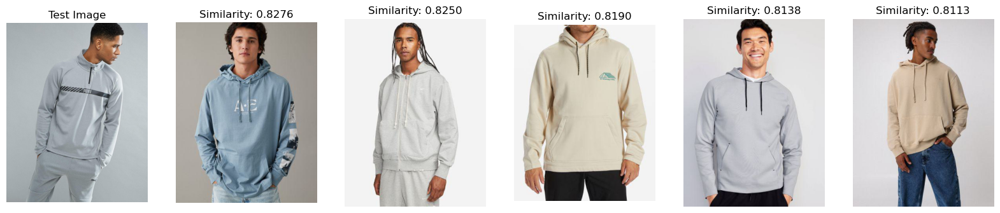

Processing bottomwear for ../yolo/ecommerce_dataset/train/images/dataset_sudaderas_682.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Query embedding for bottomwear: [[    0.39669      1.4812           0 ...     0.45937      0.4029      1.1965]]...


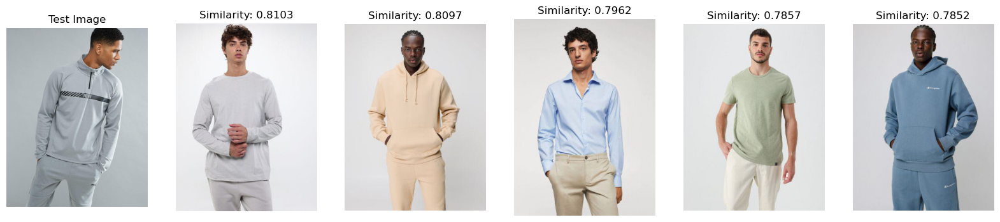


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../yolo/ecommerce_dataset/train/images/dataset_vestidos_3320.png: 640x512 1 Topwear, 2 Footwears, 70.9ms
Speed: 1.9ms preprocess, 70.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 512)
Detected Topwear with confidence 0.85 at [192, 227, 560, 1084]
Detected Footwear with confidence 0.70 at [386, 970, 470, 1107]
Detected Footwear with confidence 0.36 at [135, 998, 243, 1107]
Predicted gender for ../yolo/ecommerce_dataset/train/images/dataset_vestidos_3320.png: women
Processing topwear for ../yolo/ecommerce_dataset/train/images/dataset_vestidos_3320.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
Query embedding for topwear: [[    0.21326     0.54401           0 ...     0.21798    0.002943     0.71187]]...


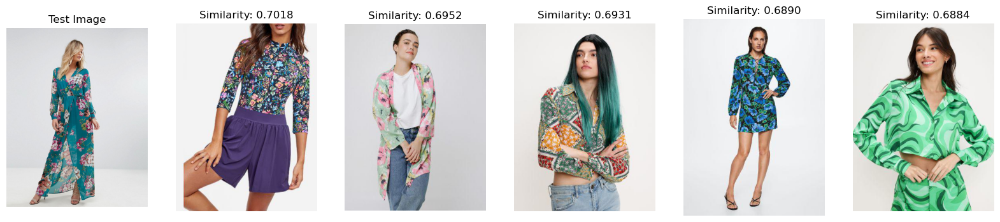

Processing footwear for ../yolo/ecommerce_dataset/train/images/dataset_vestidos_3320.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
Query embedding for footwear: [[          0     0.50892    0.027523 ...     0.66572     0.98476     0.72982]]...


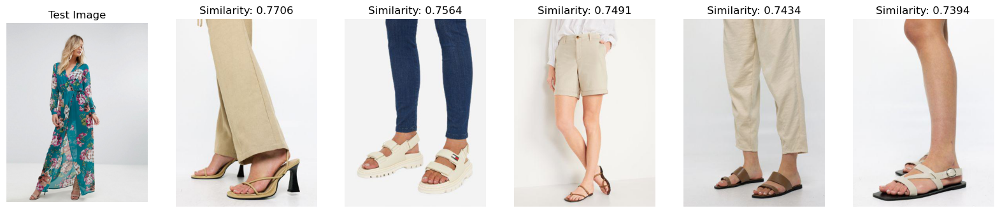


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../yolo/ecommerce_dataset/train/images/dataset_jeans_510.png: 640x512 1 Bottomwear, 67.5ms
Speed: 1.9ms preprocess, 67.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 512)
Detected Bottomwear with confidence 0.93 at [139, 77, 490, 748]
Predicted gender for ../yolo/ecommerce_dataset/train/images/dataset_jeans_510.png: men
Processing bottomwear for ../yolo/ecommerce_dataset/train/images/dataset_jeans_510.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Query embedding for bottomwear: [[    0.27174      1.4938    0.023494 ...           0           0     0.79506]]...


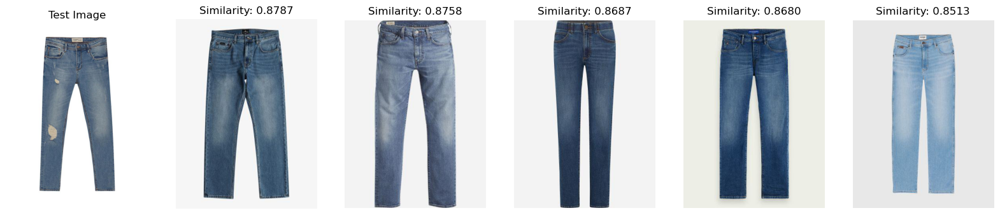


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../yolo/ecommerce_dataset/train/images/dataset_camisas-y-blusas_2399.png: 640x544 1 Topwear, 1 Bottomwear, 70.9ms
Speed: 1.8ms preprocess, 70.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 544)
Detected Topwear with confidence 0.88 at [114, 136, 354, 469]
Detected Bottomwear with confidence 0.81 at [123, 431, 388, 543]
Predicted gender for ../yolo/ecommerce_dataset/train/images/dataset_camisas-y-blusas_2399.png: women
Processing topwear for ../yolo/ecommerce_dataset/train/images/dataset_camisas-y-blusas_2399.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Query embedding for topwear: [[    0.14584      1.5768           0 ...     0.01364           0    0.049183]]...


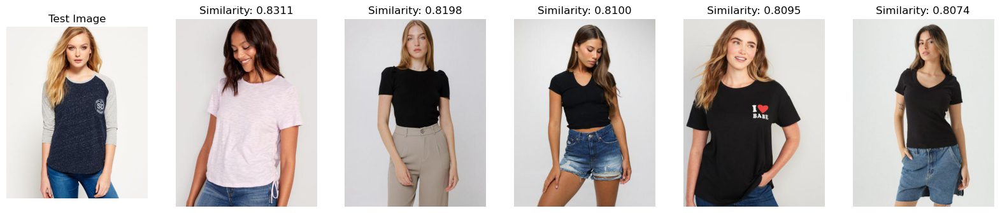

Processing bottomwear for ../yolo/ecommerce_dataset/train/images/dataset_camisas-y-blusas_2399.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Query embedding for bottomwear: [[     1.7501     0.25595   0.0049387 ...    0.079378     0.12481      0.8287]]...


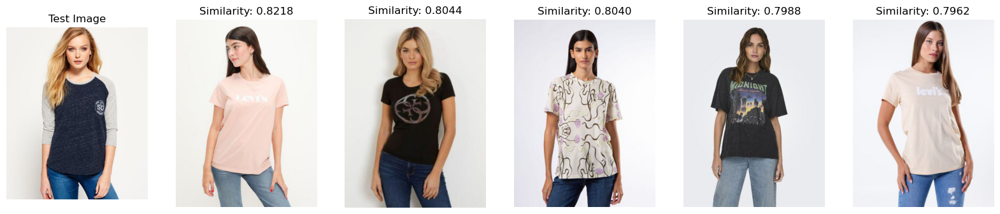


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../yolo/ecommerce_dataset/train/images/dataset_pantalones_4891.png: 640x512 1 Topwear, 1 Bottomwear, 2 Footwears, 69.8ms
Speed: 2.3ms preprocess, 69.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 512)
Detected Bottomwear with confidence 0.92 at [312, 440, 596, 982]
Detected Topwear with confidence 0.88 at [262, 132, 603, 511]
Detected Footwear with confidence 0.84 at [284, 959, 437, 1080]
Detected Footwear with confidence 0.83 at [466, 971, 547, 1100]
Predicted gender for ../yolo/ecommerce_dataset/train/images/dataset_pantalones_4891.png: women
Processing topwear for ../yolo/ecommerce_dataset/train/images/dataset_pantalones_4891.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Query embedding for topwear: [[    0.13089     0.76859           0 ...     0.14066     0.53982      1.1501]]...


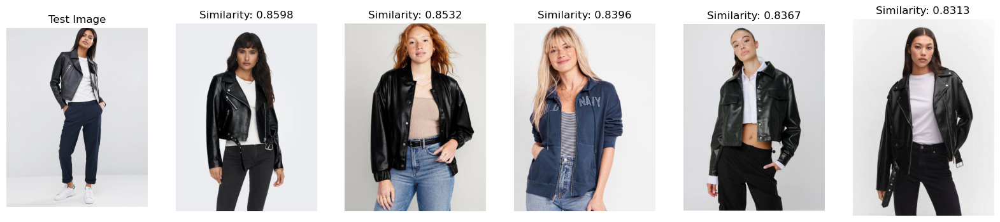

Processing bottomwear for ../yolo/ecommerce_dataset/train/images/dataset_pantalones_4891.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Query embedding for bottomwear: [[    0.15944      1.3005           0 ...      1.7045     0.12725        1.35]]...


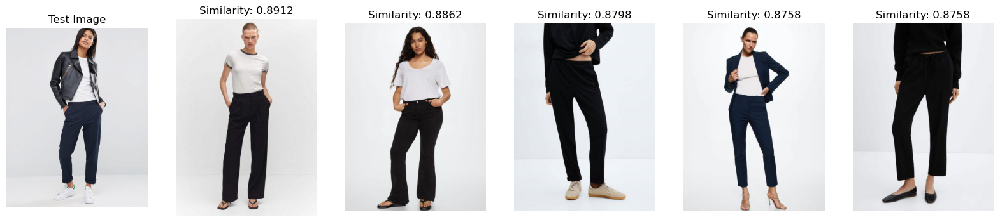

Processing footwear for ../yolo/ecommerce_dataset/train/images/dataset_pantalones_4891.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Query embedding for footwear: [[          0     0.29278    0.054299 ...      0.5882     0.34007     0.85357]]...


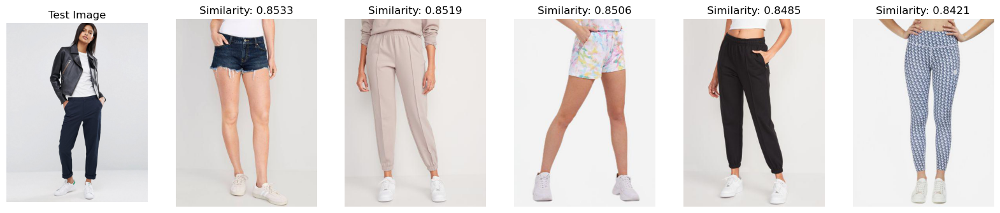


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/embeddings/../yolo/ecommerce_dataset/train/images/dataset_tacones_17.png: 640x512 1 Bottomwear, 2 Footwears, 68.7ms
Speed: 2.1ms preprocess, 68.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 512)
Detected Bottomwear with confidence 0.92 at [210, 0, 806, 677]
Detected Footwear with confidence 0.86 at [383, 685, 756, 921]
Detected Footwear with confidence 0.85 at [55, 674, 457, 914]
Predicted gender for ../yolo/ecommerce_dataset/train/images/dataset_tacones_17.png: men
Processing bottomwear for ../yolo/ecommerce_dataset/train/images/dataset_tacones_17.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Query embedding for bottomwear: [[    0.43271      1.1233    0.025911 ...    0.046993    0.021387     0.19881]]...


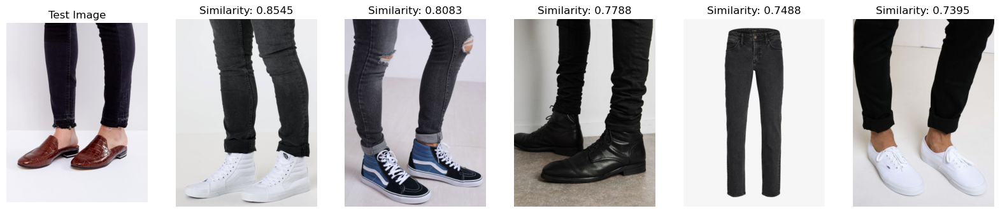

Processing footwear for ../yolo/ecommerce_dataset/train/images/dataset_tacones_17.png...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
Query embedding for footwear: [[          0     0.45984      0.3662 ...     0.20964      0.4225  0.00061447]]...


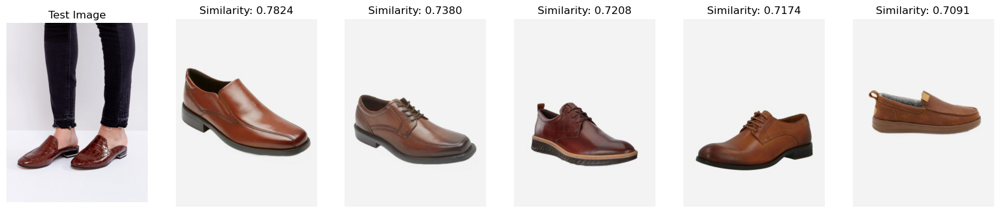

In [156]:
# Random 10 images 
import os
import random
import glob

# Path to the image folder
image_folder = '../yolo/ecommerce_dataset/train/images/'

# Get a list of all images in the folder
all_images = glob.glob(os.path.join(image_folder, '*.png'))

# Randomly select 50 images from the folder
random_images = random.sample(all_images, 10)

# Loop through each selected random image path
for test_image_path in random_images:
    # Extract parts and calculate embeddings
    extracted_parts = extract_clothes(test_image_path)

    # Predict the gender of the test image
    gender = predict_gender(test_image_path)
    print(f"Predicted gender for {test_image_path}: {gender}")

    # Example: Recommend similar items for each part (topwear, bottomwear, footwear)
    for part in ['topwear', 'bottomwear', 'footwear']:
        if part in extracted_parts:
            print(f"Processing {part} for {test_image_path}...")
            query_embedding = calculate_embeddings(extracted_parts[part])
            
            if query_embedding is not None:
                print(f"Query embedding for {part}: {query_embedding[:5]}...")  # Print first 5 elements of the embedding
                recommend_items(part, query_embedding, gender, top_n=5)
